In [23]:
%reset

PySPM version: 0.2.23
Channels
	S [ZSensor] "Height Sensor"
	S [] "Peak Force Error"
	S [Stiffness] "DMTModulus"
	S [LogStiffness] "LogDMTModulus"
	S [Adhesion] "Adhesion"
	S [Deformation] "Deformation"
	S [Dissipation] "Dissipation"
	S [Height] "Height"


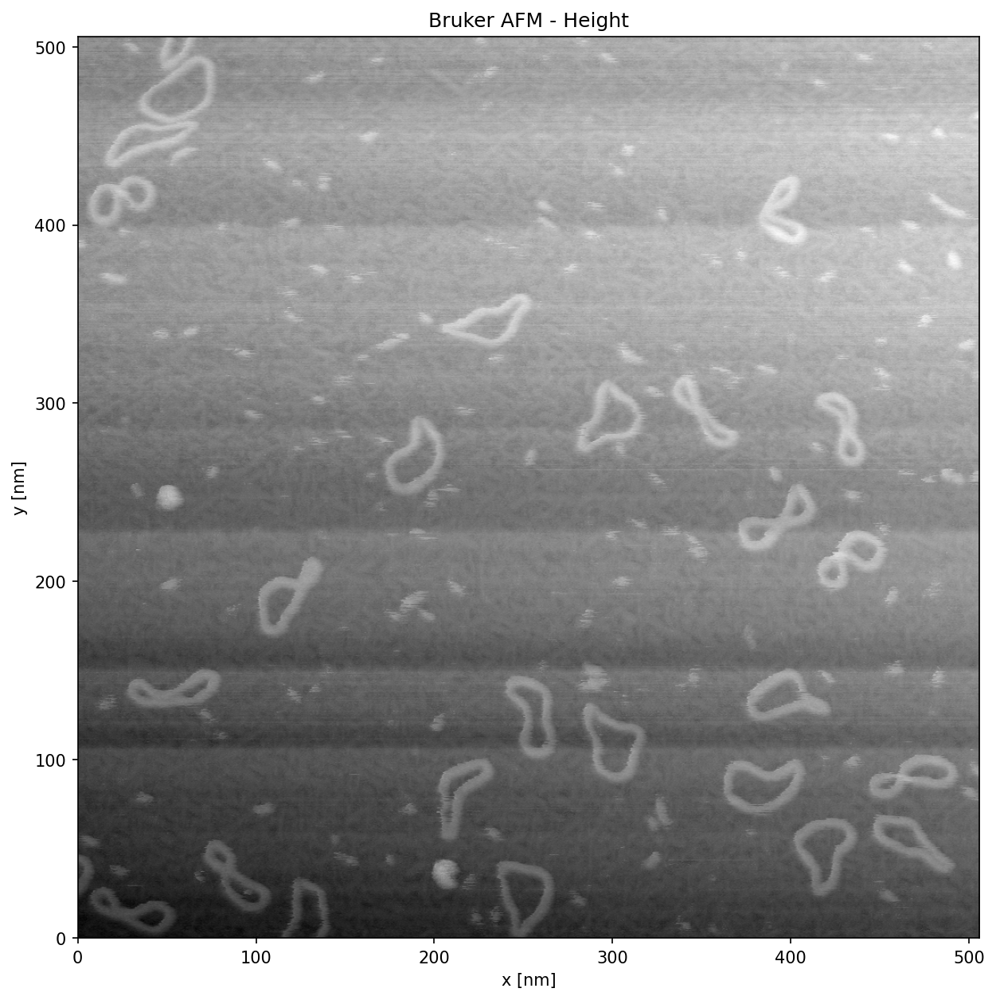

In [24]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import copy
import io
from skimage import morphology as skimorph
from skimage import filters as skifilter
from skimage import segmentation as skisegment
from skimage import measure as skimeasure
from skimage import exposure as skiexposure

import pySPM 
print(f'PySPM version: {pySPM.__version__}')

# Matplotlib config
%matplotlib inline
mpl.rcParams['figure.dpi'] = 150

# Get data
filename = '../minicircle.spm'
# filename = '../20210810_NDP52_TRIS_pll.0_00050.spm'
scan = pySPM.Bruker(filename)
scan.list_channels()

# Pull the relevant data
height = scan.get_channel("Height")

# Make plots
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the data 
height.show(ax=ax)

# Set the data that we are working with
data = height


In [25]:
def align_rows(data):

    # Get quantiles 
    row_quantiles, col_quantiles = row_col_quantiles(data)

    # Align row medians
    # Calcultate median row height
    row_medians = row_quantiles[:, 1]
    median_row_height = np.quantile(row_medians, 0.5)
    print(f'median_row_height: {median_row_height}')

    # Calculate the differences between the row medians and the median median
    row_median_diffs = row_medians - median_row_height

    # Adjust the row medians accordingly
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            data[i, j] -= row_median_diffs[i]

    return data

In [26]:
def row_col_quantiles(data, debug=False):

    # Calculate row and column quantiles
    row_quantiles = np.zeros((data.shape[0], 3))
    col_quantiles = np.zeros((data.shape[1], 3))
    
    for i in range(data.shape[0]):
        row = data[i, :]
        row_quantiles[i] = np.array([np.quantile(row, 0.25), 
        np.quantile(row, 0.5), 
        np.quantile(row, 0.75)])

    for j in range(data.shape[1]):
        col = data[:, j]
        col_quantiles[j] = np.array([np.quantile(col, 0.25),
        np.quantile(col, 0.5),
        np.quantile(col, 0.75)])
        
    if debug:
        print('shape row quants: ', row_quantiles.shape)
        print('shape col quants: ', col_quantiles.shape)

    return row_quantiles, col_quantiles
    


In [27]:
def remove_x_y_tilt(data):

    # Get row and column quantiles
    row_quantiles, col_quantiles = row_col_quantiles(data)

    # Calculate x gradient from left to right
    x_diff = row_quantiles[-1][1] - row_quantiles[0][1]
    print(f'x_diff: {x_diff}')
    # Calculate gradient of brightness / pixel
    x_grad = x_diff / data.shape[0]
    print(f'x_grad: {x_grad}')

    # Do same for y
    y_diff = col_quantiles[-1][1] - col_quantiles[0][1]
    print(f'y_diff: {y_diff}')
    y_grad = y_diff / data.shape[1]
    print(f'y_grad: {y_grad}')

    # Add corrections to the data
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            data[i, j] -= x_grad * i
            data[i, j] -= y_grad * j

    return data

In [28]:
def plot_data(data):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    # ax.imshow(data, cmap='viridis')
    ax.imshow(data, cmap='afmhot')

In [29]:
def row_col_quantiles_thresholded(data, binary_mask, debug=False):

    # Mask the data so we only obtain the medians for the background
    masked_data = np.ma.masked_array(data, mask=binary_mask, fill_value=np.nan)
    data = masked_data

    # Calculate row and column quantiles
    row_quantiles = np.zeros((data.shape[0], 3))
    col_quantiles = np.zeros((data.shape[1], 3))
    
    for i in range(data.shape[0]):
        row = data[i, :]
        row_quantiles[i] = np.array([np.quantile(row, 0.25), 
        np.quantile(row, 0.5), 
        np.quantile(row, 0.75)])

    for j in range(data.shape[1]):
        col = data[:, j]
        col_quantiles[j] = np.array([np.quantile(col, 0.25),
        np.quantile(col, 0.5),
        np.quantile(col, 0.75)])
        
    if debug:
        print('shape row quants: ', row_quantiles.shape)
        print('shape col quants: ', col_quantiles.shape)

    return row_quantiles, col_quantiles

In [30]:
def align_rows_thresholded(data, binary_mask):

    # Get quantiles for the background data
    row_quantiles, col_quantiles = row_col_quantiles_thresholded(data, binary_mask)

    # Align row medians
    # Calcultate median row height
    row_medians = row_quantiles[:, 1]
    median_row_height = np.quantile(row_medians, 0.5)
    print(f'median_row_height: {median_row_height}')

    # Calculate the differences between the row medians and the median median
    row_median_diffs = row_medians - median_row_height

    # Adjust the row medians accordingly
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            data[i, j] -= row_median_diffs[i]

    return data

In [31]:
def remove_x_y_tilt_thresholded(data, binary_mask):

    # Get row and column quantiles of the background data
    row_quantiles, col_quantiles = row_col_quantiles_thresholded(data, binary_mask)

    # Calculate x gradient from left to right
    x_diff = row_quantiles[-1][1] - row_quantiles[0][1]
    print(f'x_diff: {x_diff}')
    # Calculate gradient of brightness / pixel
    x_grad = x_diff / data.shape[0]
    print(f'x_grad: {x_grad}')

    # Do same for y
    y_diff = col_quantiles[-1][1] - col_quantiles[0][1]
    print(f'y_diff: {y_diff}')
    y_grad = y_diff / data.shape[1]
    print(f'y_grad: {y_grad}')

    # Add corrections to the data
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            data[i, j] -= x_grad * i
            data[i, j] -= y_grad * j

    return data


 ############ Bad flattening ############  
 ============= Bad align rows =============  
median_row_height: 29.29087487488389
 =========== Bad remove x y tilt ========== 
x_diff: 0.0
x_grad: 0.0
y_diff: 3.2348438429895303
y_grad: 0.003159027190419463

 ############ Better flattening ############  
 =========== Masked align rows ===========  
median_row_height: 27.602635547910538
 ========= Masked remove x y tilt ========  
x_diff: 0.0
x_grad: 0.0
y_diff: 0.010307573729150477
y_grad: 1.0065989969873512e-05

 ############ Median zeroing ############  
mean row median: 
0.006576860748826322


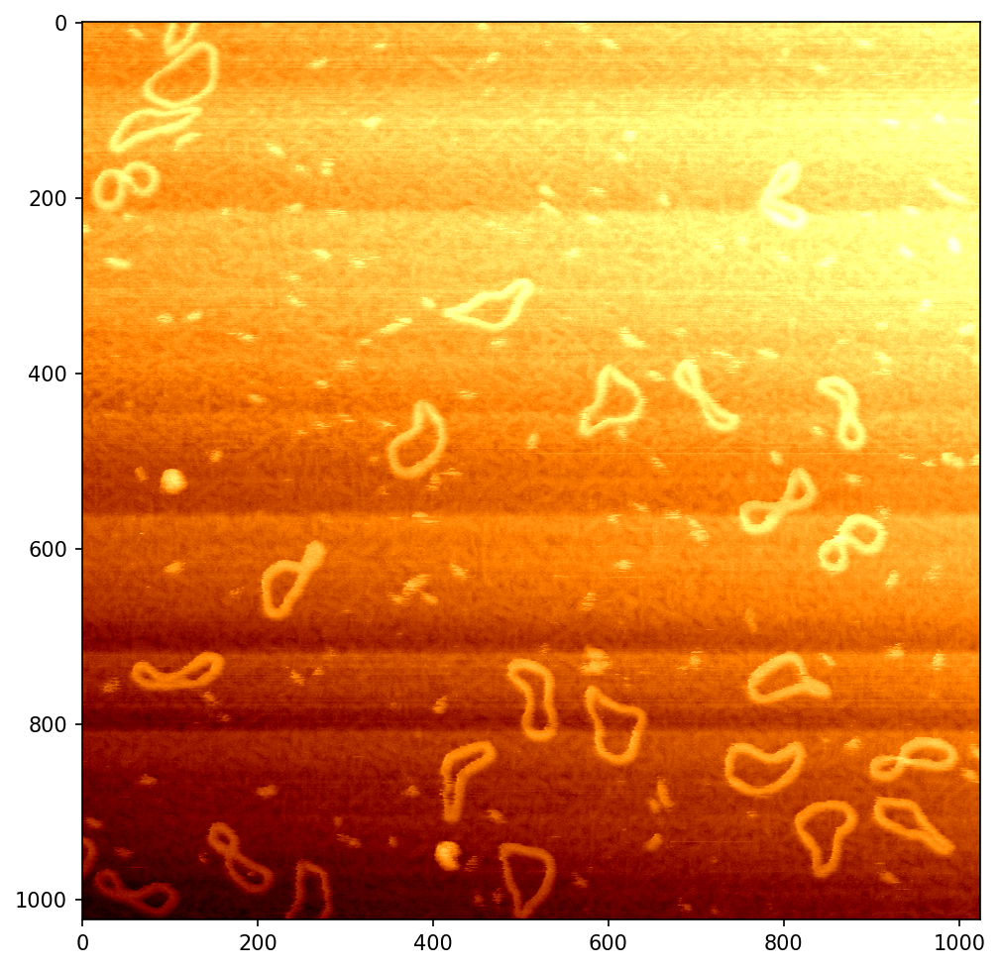

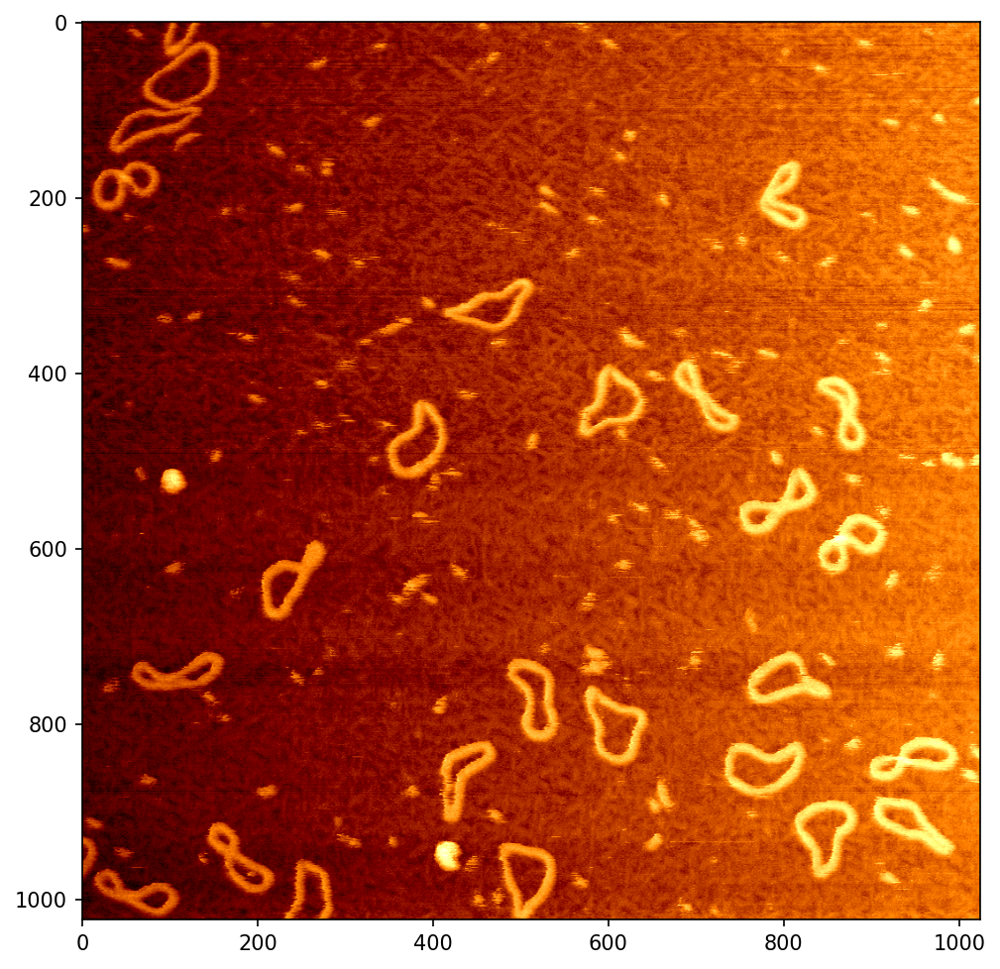

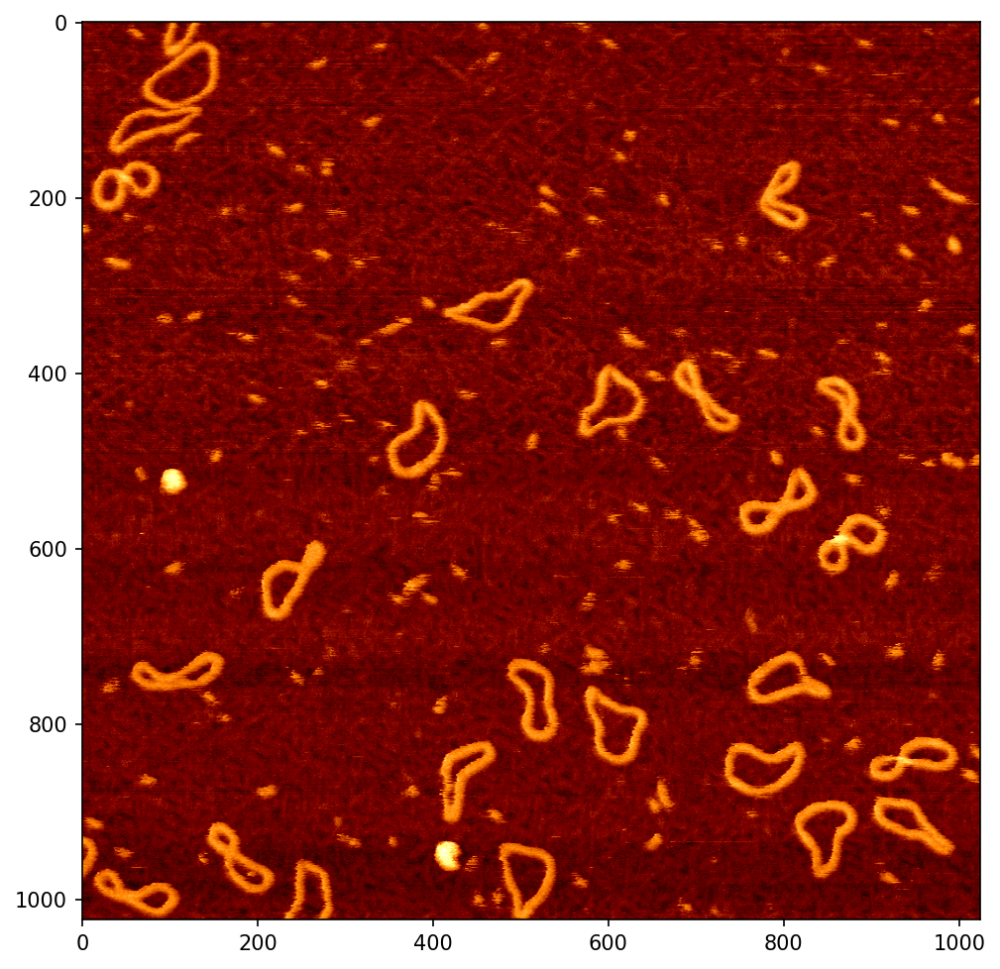

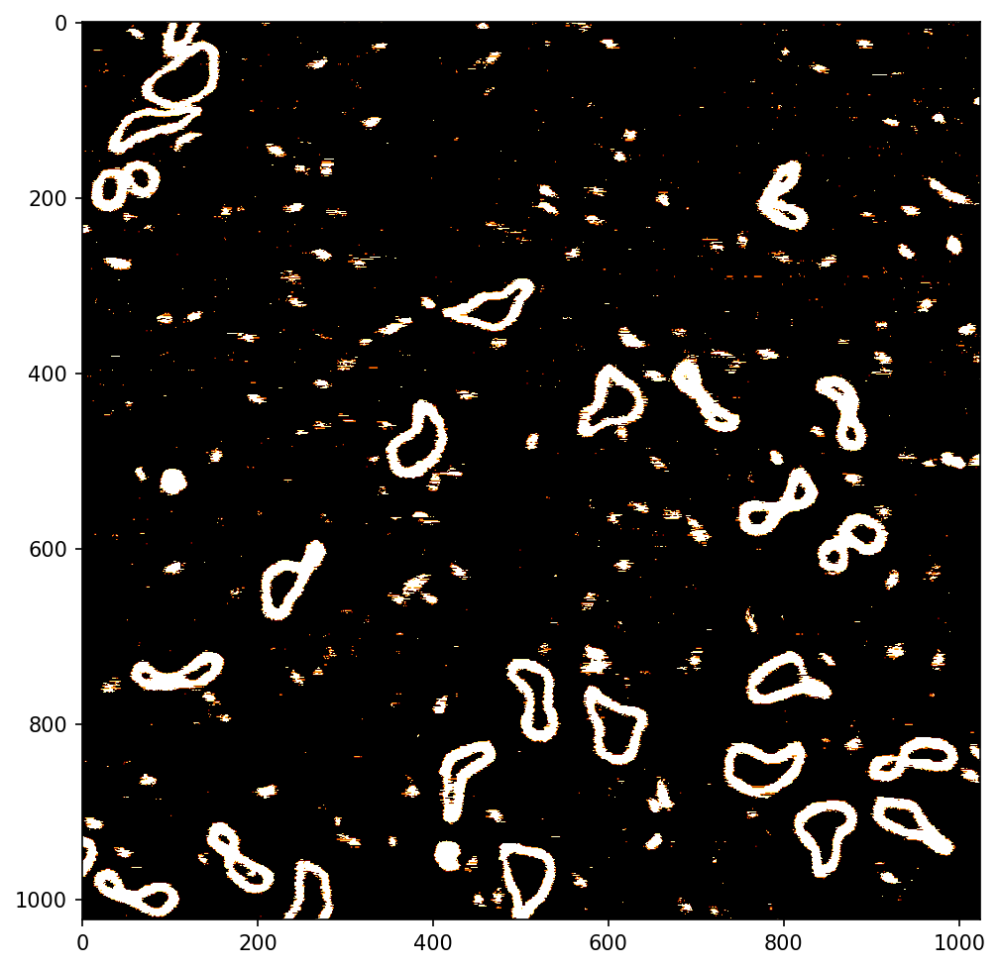

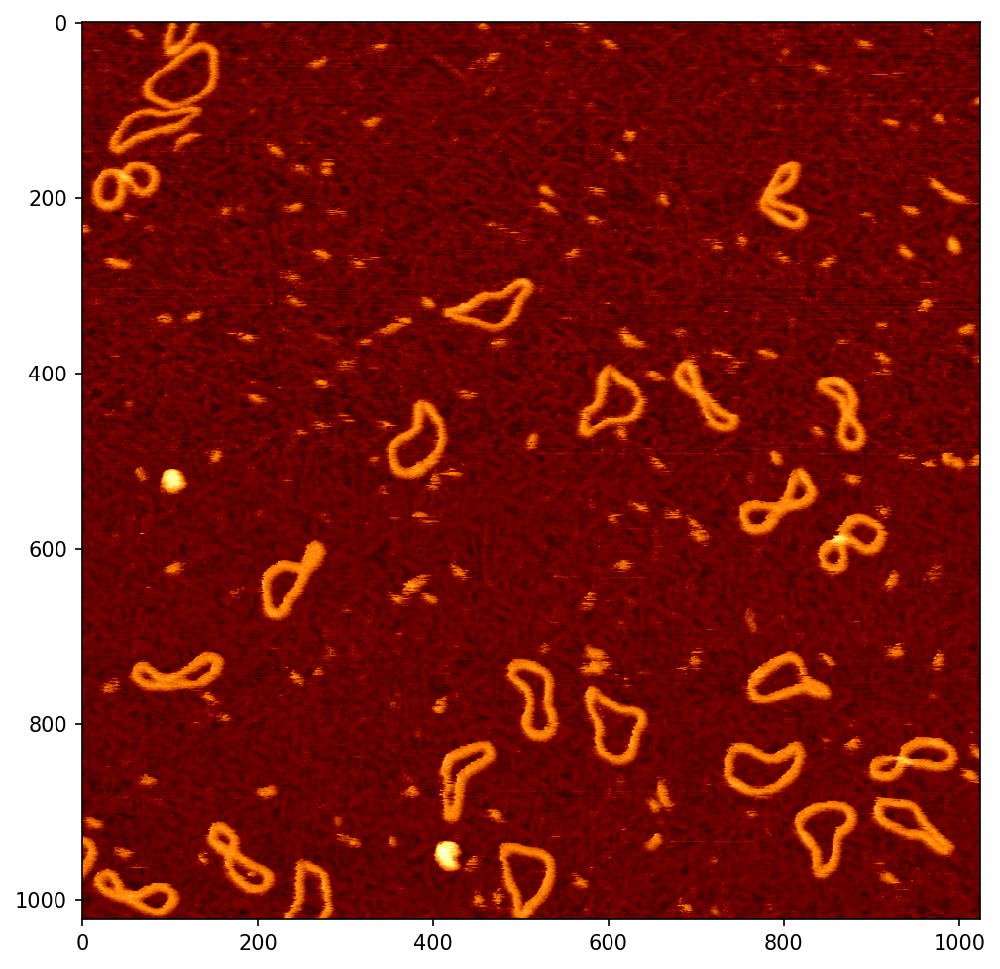

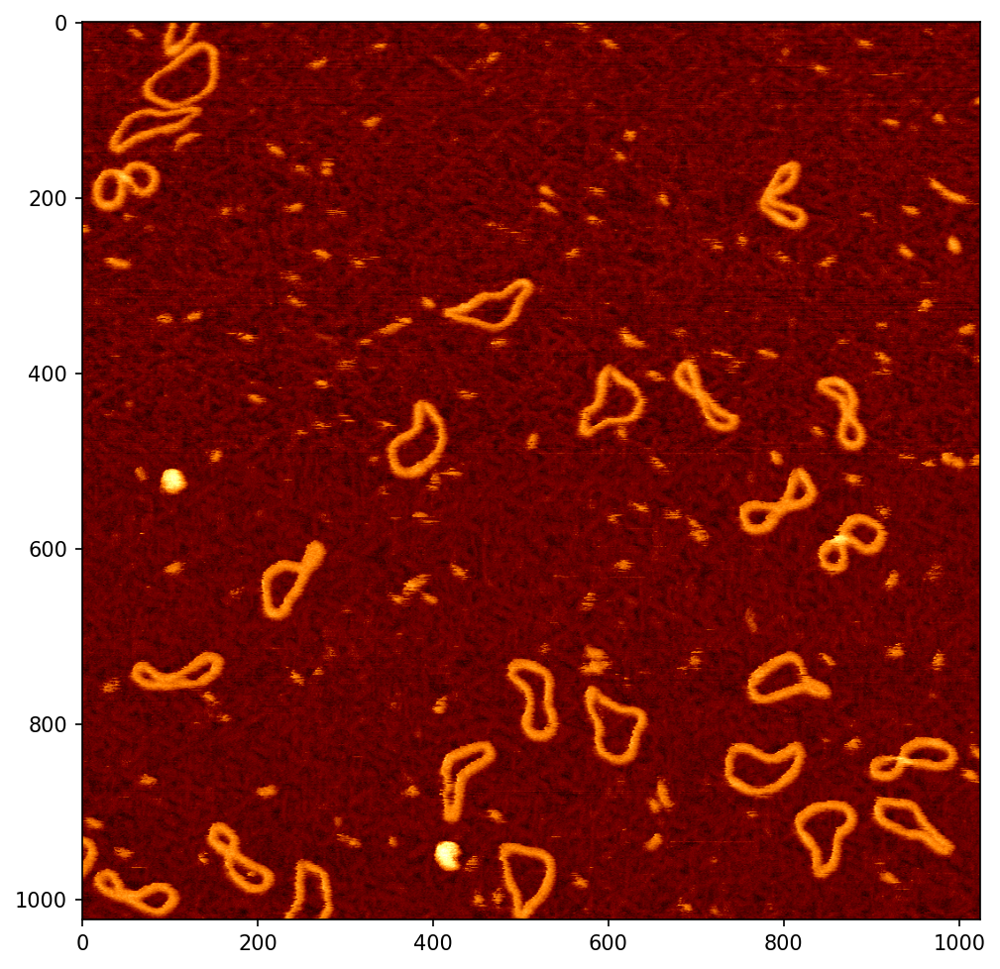

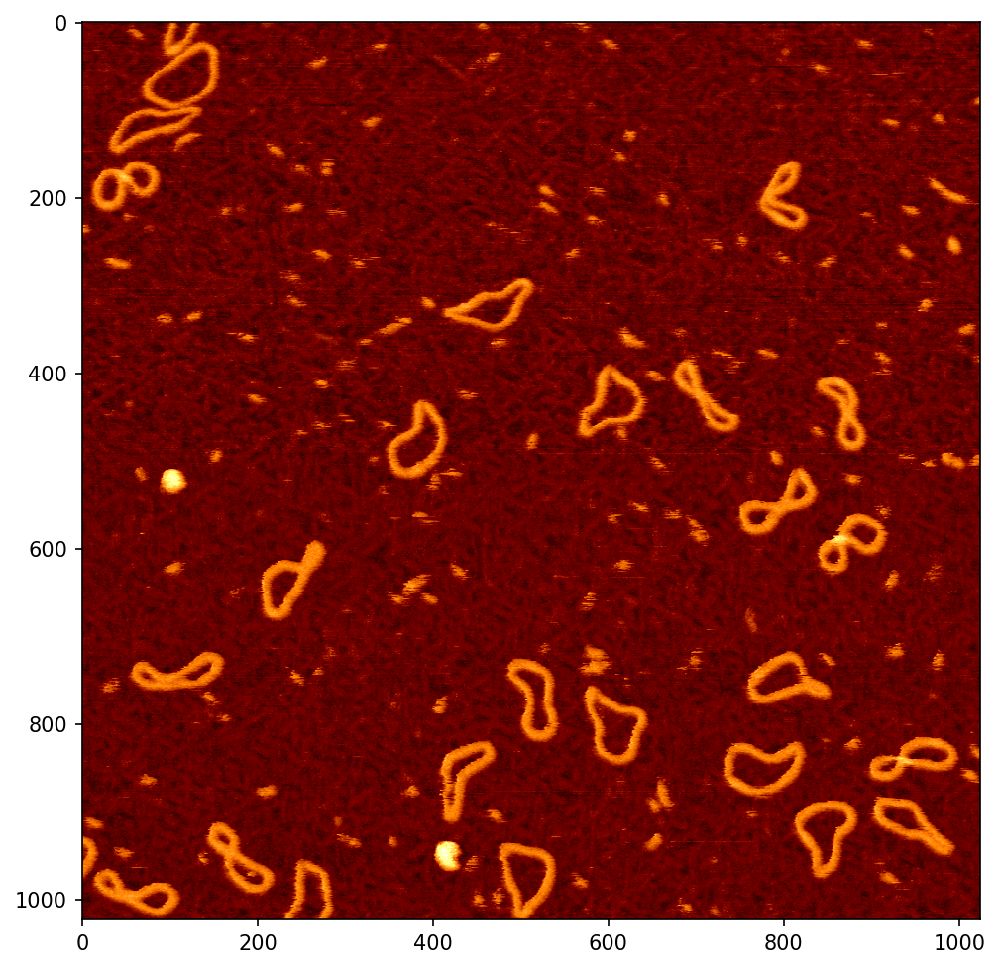

In [34]:
# Copy data array
data_threshold = np.flipud(np.array(height.pixels))

# Original data
print(f'\n ############ Bad flattening ############  ')
plot_data(data_threshold)

# Perform bad flattening
print(f' ============= Bad align rows =============  ')
bad_flattening = align_rows(data_threshold)
plot_data(bad_flattening)
print(f' =========== Bad remove x y tilt ========== ')
bad_flattening = remove_x_y_tilt(bad_flattening)
plot_data(bad_flattening)

# Use bad flattening to obtain a mask
from skimage.filters import threshold_otsu
threshold = threshold_otsu(bad_flattening)

# Construct the binary mask from the original data and background/foreground threshold value
binary_mask = data_threshold > threshold

# Display the binary mask
plot_data(binary_mask)

# Display results
print(f'\n ############ Better flattening ############  ')
print(' =========== Masked align rows ===========  ')
data_threshold = align_rows_thresholded(data_threshold, binary_mask)
plot_data(data_threshold)
print(' ========= Masked remove x y tilt ========  ')
data_threshold = remove_x_y_tilt_thresholded(data_threshold, binary_mask)
plot_data(data_threshold)


# Adjust backgorund median to be zero. 
print(f'\n ############ Median zeroing ############  ')
# Get the median background value 
row_quantiles, col_quantiles = row_col_quantiles_thresholded(data_threshold, binary_mask)
for row_index in range(data_threshold.shape[0]):
    # For each row, subtract the difference from zero of the median value
    row_zero_offset = row_quantiles[row_index, 1]
    # for col_index in range(data.shape[1]):
    data_threshold[row_index, :] -= row_zero_offset
row_quantiles, col_quantiles = row_col_quantiles_thresholded(data_threshold, binary_mask)
print(f'mean row median: ')
print(np.mean(row_quantiles))
plot_data(data_threshold)


[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]
[array([False, False, False, ..., False, False, False])]


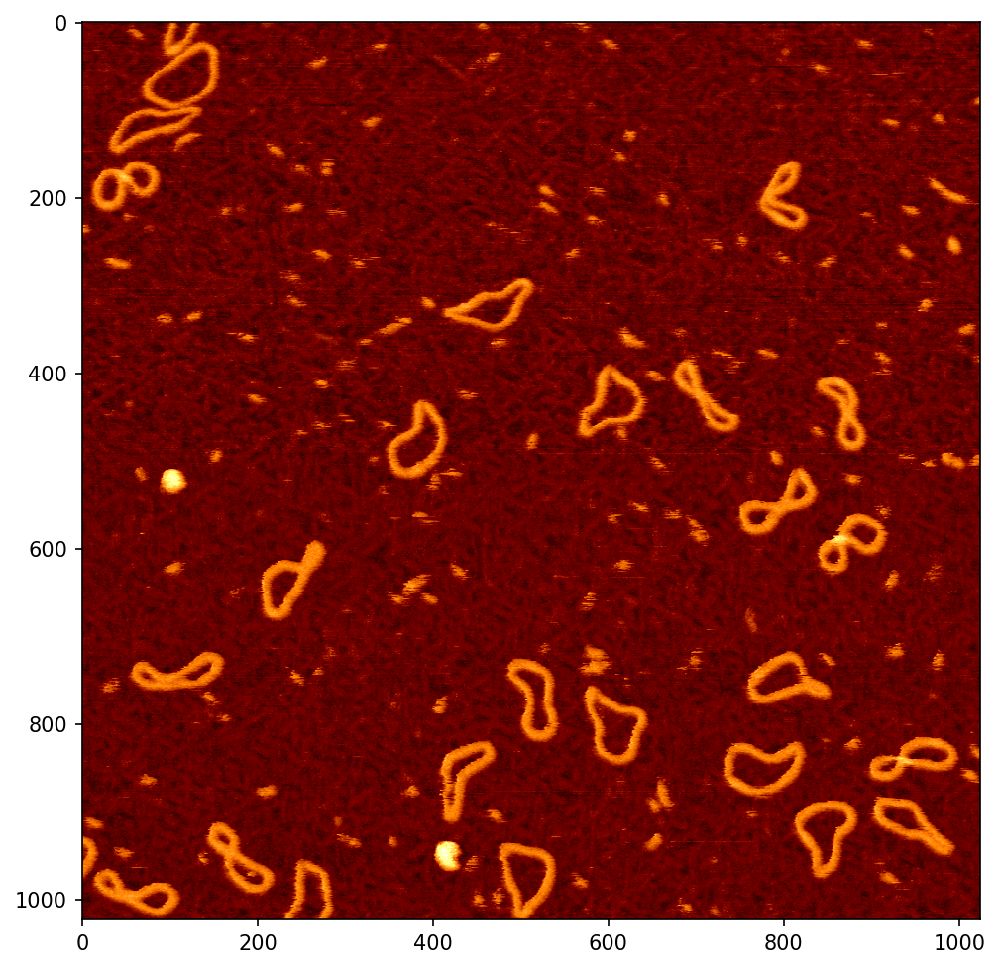

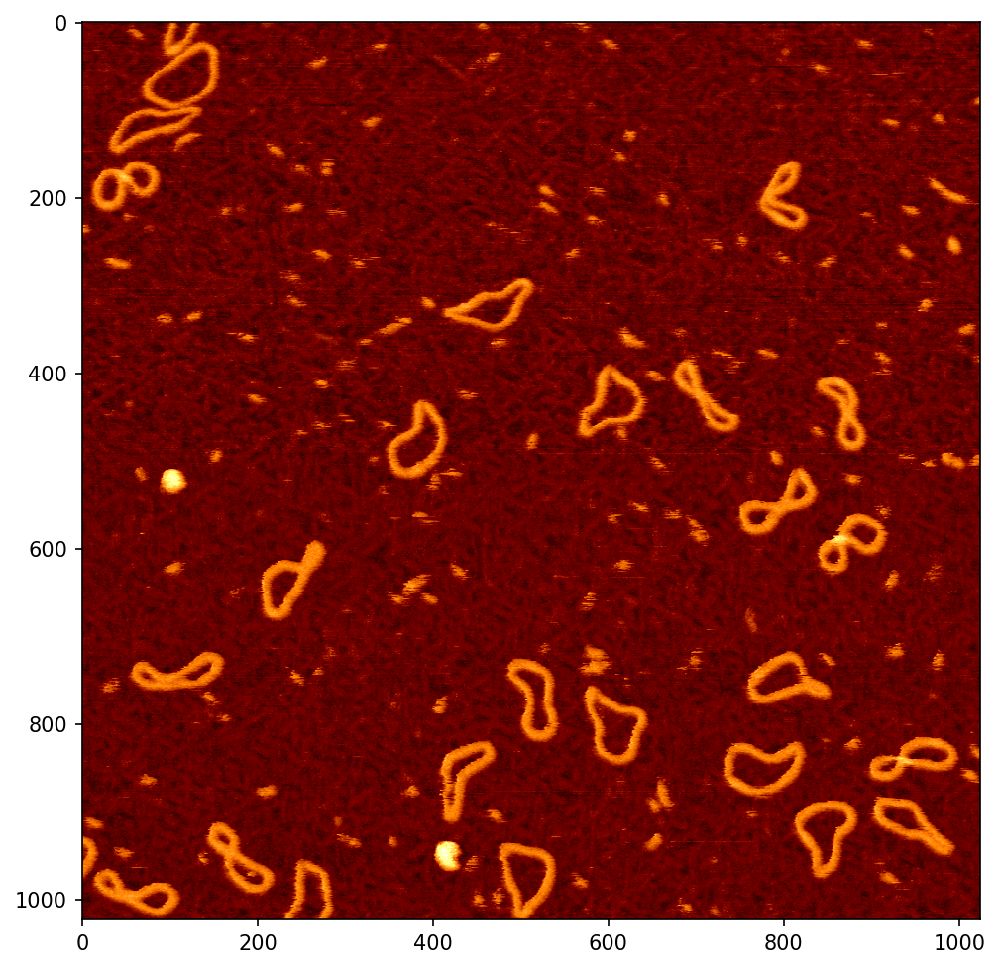

In [ ]:
# Remove scars 
data_copy = np.copy(data_threshold)

max_width = 1
min_length = 10
min_difference = 40

plot_data(data_copy)

# Find bright line segments that are long enough
# For row in the image
for index, row in enumerate(data_copy):
    # Find the median
    median = np.quantile(row, 0.5)
    # print(f'row: {index}, median: {median}')

    # Find the value 50% above the median
    # bright_values = [row > median + min_difference]
    bright_indexes = [row > 50]

    if index % 100 == 0:
        print(bright_indexes)
    
    for bright_index in bright_indexes:
        data_copy[index, bright_index] = 0
    
plot_data(data_copy)
    # Find the values above that value
    # See if any of the values are in a line greater than 10 pixels

    # Check if the rows above and below differ by at least some quotient

    # Mark as a scar



In [ ]:
array = np.array([1, 2, 3, 5, 6, 7, 8, 9])
bright_points = array > 5

print(bright_points)

# for point in bright_points:
    

IndentationError: expected an indented block (Temp/ipykernel_22584/3873544241.py, line 7)